In [2]:
# data config libraries
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from collections import Counter

# display config libraries
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# openCV
import cv2

# tensorflow and keras
import tensorflow as tf
from tensorflow.keras.models import Model # type: ignore
from tensorflow.keras.layers import Dense, Flatten # type: ignore
from tensorflow.keras.applications.vgg19 import VGG19 # type: ignore

# Ignore Warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
# Import custom packages and utility files

from DataUtility import dataUtils
dataUtils = dataUtils()

from DataUtility import SKIN_CANCER_TUMOR_TYPE

from ModelTrainer import ModelTrainer
modelTrainer = ModelTrainer()

from ModelValidator import ValidateModel
validateModel = ValidateModel()

## Data Exploration

<br>

Samples of the Malignant (cancerous) Tumors...

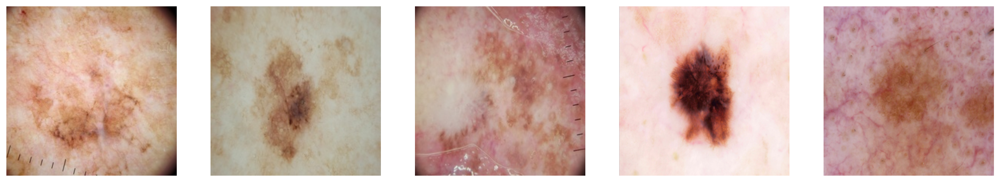

<br>

Samples of the Benign (non-cancerous) Tumors...

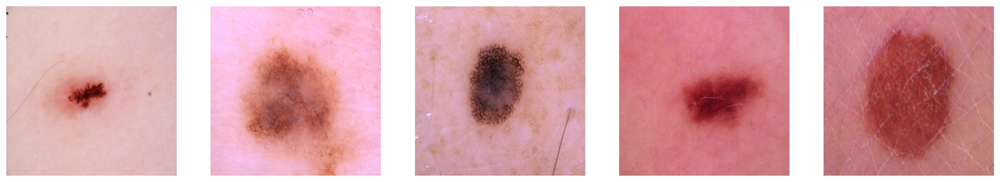

<br>

Our Dataset

                                     filename      label
0   ISIC Skin Cancer/images/malignant\507.jpg  Malignant
1  ISIC Skin Cancer/images/malignant\1465.jpg  Malignant
2      ISIC Skin Cancer/images/benign\820.jpg     Benign
3      ISIC Skin Cancer/images/benign\311.jpg     Benign
4  ISIC Skin Cancer/images/malignant\1068.jpg  Malignant


<br>

Dataframe Info...

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3297 entries, 0 to 3296
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  3297 non-null   object
 1   label     3297 non-null   object
dtypes: object(2)
memory usage: 51.6+ KB
None


<br>

Sample Images...

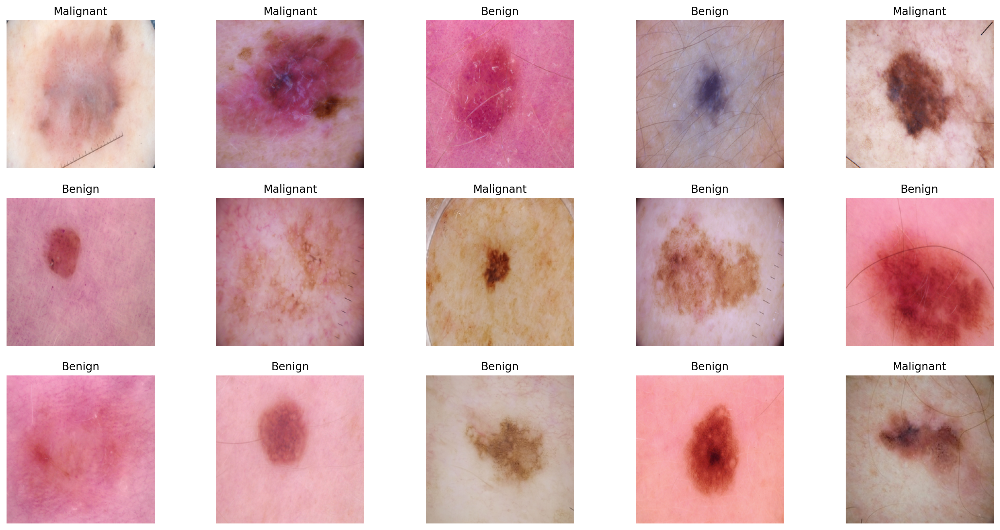

<br>

Shape Distribution for Malignant Images:

Counter({(224, 224, 3): 1497})


<br>

Shape Distribution for Benign Images:

Counter({(224, 224, 3): 1800})


In [4]:
# Sample Images
dataUtils.PrintMarkdownText('Samples of the Malignant (cancerous) Tumors...')
dataUtils.ReadAndDisplayInputImages(SKIN_CANCER_TUMOR_TYPE.MALIGNANT.value, 5)
dataUtils.PrintMarkdownText('Samples of the Benign (non-cancerous) Tumors...')
dataUtils.ReadAndDisplayInputImages(SKIN_CANCER_TUMOR_TYPE.BENIGN.value, 5)

# Our Dataset
df = dataUtils.GetLabelledSkinCancerData()
dataUtils.PrintMarkdownText('Our Dataset')
print(df.head())
dataUtils.PrintMarkdownText('Dataframe Info...')
print(df.info())

#Sample Annonated Data
dataUtils.PrintMarkdownText('Sample Images...')
dataUtils.DisplayAnnotatedImages(df, 15)

# Images Info
dataUtils.PrintMarkdownText('Shape Distribution for Malignant Images:')
print(dataUtils.GetAllImageShape(SKIN_CANCER_TUMOR_TYPE.MALIGNANT.value))
dataUtils.PrintMarkdownText('Shape Distribution for Benign Images:')
print(dataUtils.GetAllImageShape(SKIN_CANCER_TUMOR_TYPE.BENIGN.value))

## Data Preperation

In [5]:
# Train - Test - Validation Split
train_files, test_files, train_labels, test_labels = train_test_split(df['filename'].values,
                                                                      df['label'].values, 
                                                                      test_size=0.15, random_state=42)

test_files, validation_files, test_labels, validation_labels = train_test_split(test_files,
                                                                    test_labels, 
                                                                    test_size=0.40, random_state=42)

# Length of Data
dataUtils.PrintMarkdownText('Length of the generated datasets...')
print(" -- Train Set Length: " + str(len(train_files)) + ' samples'
      "\n -- Validation Set Length: "  + str(len(validation_files)) + ' samples'
      "\n -- Test Set Length: " + str(len(test_files)) + ' samples')

# Data Label Segregated
dataUtils.PrintMarkdownText('***Tally of occurrences of the 2 labels in the generated datasets...***')
print('Training Data:', Counter(train_labels), 
      '\n\nValidation Data:', Counter(validation_labels), 
      '\n\nTest Data:', Counter(test_labels))

<br>

Length of the generated datasets...

 -- Train Set Length: 2802 samples
 -- Validation Set Length: 198 samples
 -- Test Set Length: 297 samples


<br>

***Tally of occurrences of the 2 labels in the generated datasets...***

Training Data: Counter({'Benign': 1549, 'Malignant': 1253}) 

Validation Data: Counter({'Benign': 103, 'Malignant': 95}) 

Test Data: Counter({'Malignant': 149, 'Benign': 148})


In [6]:
# Image Preprocessing

train_data = dataUtils.ReadAllImages(imageList = train_files, resizeImage = True, newImageSize = (135, 135))
validation_data = dataUtils.ReadAllImages(imageList = validation_files, resizeImage = True, newImageSize = (135, 135))
test_data = dataUtils.ReadAllImages(imageList = test_files, resizeImage = True, newImageSize = (135, 135))

X_test = test_data / 255.

In [7]:
#Label Encoding
lbl_encoder = LabelEncoder()
lbl_encoder.fit(train_labels)

y_train = lbl_encoder.transform(train_labels)
y_validation = lbl_encoder.transform(validation_labels)
y_test = lbl_encoder.transform(test_labels)

dataUtils.PrintMarkdownText('***Categorical & Encoded Training Labels...***')
print("Categorical Train Labels:", list(train_labels[:10]), 
      "\n\nEncoded Train Labels:    ", y_train[:10])

<br>

***Categorical & Encoded Training Labels...***

Categorical Train Labels: ['Benign', 'Benign', 'Benign', 'Benign', 'Benign', 'Benign', 'Malignant', 'Benign', 'Benign', 'Malignant'] 

Encoded Train Labels:     [0 0 0 0 0 0 1 0 0 1]


## Model Training and Validation

In [8]:
# Training Parameters
BATCH_SIZE = 32
NUM_CLASSES = 2
EPOCHS = 30
INPUT_SHAPE = (135, 135, 3)

In [10]:
from tensorflow.keras.applications import ResNet50

# Defining Model
base_model = ResNet50(include_top=False, weights='imagenet', input_shape=INPUT_SHAPE)
base_model.summary()


Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 135, 135,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 141, 141,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 68, 68,    │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 68, 68,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 68, 68,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 70, 70,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 34, 34,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 34, 34,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 34, 34,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 34, 34,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 34, 34,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 34, 34,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 34, 34,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 34, 34,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 34, 34,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 34, 34,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 34, 34,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [12]:
# Model Parameters Tuning
for layer in base_model.layers:
    layer.trainable = False
    
output = Flatten()(base_model.output)
output = Dense(1024, activation = 'relu', input_dim = 512)(output)
output = Dense(512, activation = 'relu')(output)
output = Dense(256, activation = 'relu')(output)
output = Dense(128, activation = 'relu')(output)
output = Dense(64, activation = 'relu')(output)
output = Dense(1, activation = 'sigmoid')(output)

model = Model(base_model.input, output, name = "SkinCancerDetection_Resnet_Model")

model.compile(optimizer='adam',
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

model.summary()

CallBackList = modelTrainer.GetCallBackList("Resnet_model")
modelTrainer.PrintModelCallBacks(CallBackList)

Model: "SkinCancerDetection_Resnet_Model"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 135, 135,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 141, 141,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 68, 68,    │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 68, 68,    │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 68, 68,    │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 70, 70,    │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 34, 34,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 34, 34,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 34, 34,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 34, 34,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 34, 34,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 34, 34,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 34, 34,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 34, 34,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 34, 34,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 34, 34,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 34, 34,    │      1,024 │ conv2_block1_3_c

 Total params: 76,714,881 (292.64 MB)

 Trainable params: 53,127,169 (202.66 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

Model Checkpoint (.Keras file) Path: ./Models/Resnet_model.keras


<br>

***Model Callback List...***

1. <keras.src.callbacks.model_checkpoint.ModelCheckpoint object at 0x0000016DBB6A6780>
2. <keras.src.callbacks.early_stopping.EarlyStopping object at 0x0000016DBBFF7680>
3. <keras.src.callbacks.reduce_lr_on_plateau.ReduceLROnPlateau object at 0x0000016DBB6A4440>


In [13]:
# Training Model
train_gen, val_gen = modelTrainer.GetImageDataGenerators(train_data, y_train, validation_data, y_validation, BATCH_SIZE)

model_history = modelTrainer.fit_generator(model,
                                                 train_gen, 
                                                 EPOCHS, 
                                                 val_gen, 
                                                 CallBackList)

<br>

***Model Training Started...***

Epoch 1/30
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 597ms/step - accuracy: 0.5137 - loss: 1.0991
Epoch 1: val_loss improved from inf to 0.81263, saving model to ./Models/Resnet_model.keras
87/87 ━━━━━━━━━━━━━━━━━━━━ 62s 661ms/step - accuracy: 0.5137 - loss: 1.0966 - val_accuracy: 0.5156 - val_loss: 0.8126 - learning_rate: 0.0010
Epoch 2/30
 1/87 ━━━━━━━━━━━━━━━━━━━━ 53s 622ms/step - accuracy: 0.6875 - loss: 0.6281
Epoch 2: val_loss improved from 0.81263 to 0.65281, saving model to ./Models/Resnet_model.keras
87/87 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.6875 - loss: 0.6281 - val_accuracy: 0.6667 - val_loss: 0.6528 - learning_rate: 0.0010
Epoch 3/30
87/87 ━━━━━━━━━━━━━━━━━━━━ 0s 644ms/step - accuracy: 0.5121 - loss: 0.7135
Epoch 3: val_loss improved from 0.65281 to 0.65156, saving model to ./Models/Resnet_model.keras
87/87 ━━━━━━━━━━━━━━━━━━━━ 62s 709ms/step - accuracy: 0.5123 - loss: 0.7133 - val_accuracy: 0.5885 - val_loss: 0.6516 - learning_rate: 0.0010
Epoch 4/30
 1/87 ━━━━━━━━━━━━━━━━

### Model Testing

10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 326ms/step


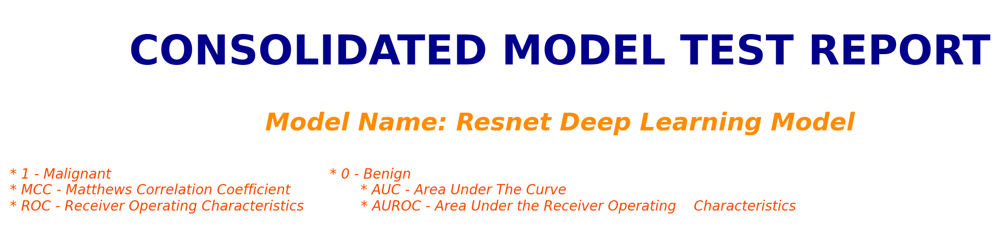

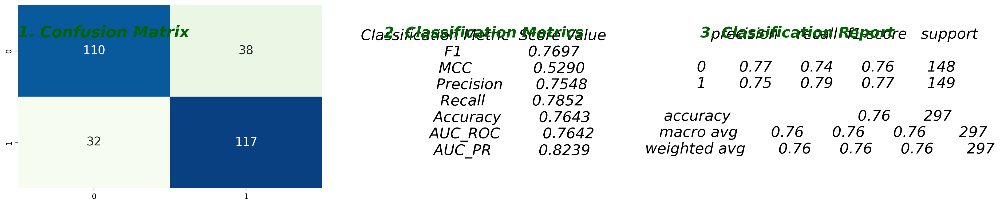

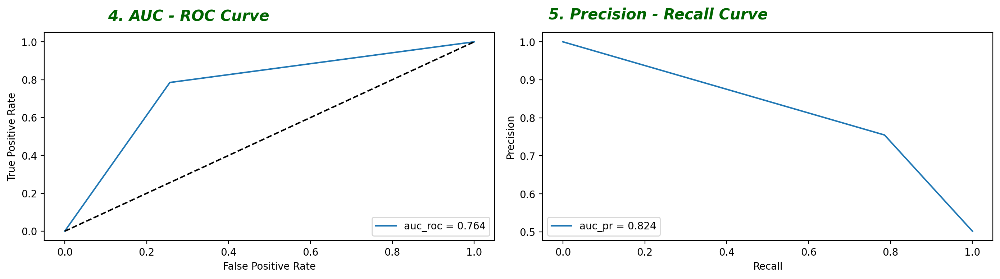

<br>

***Model test results of 16 random test images...***

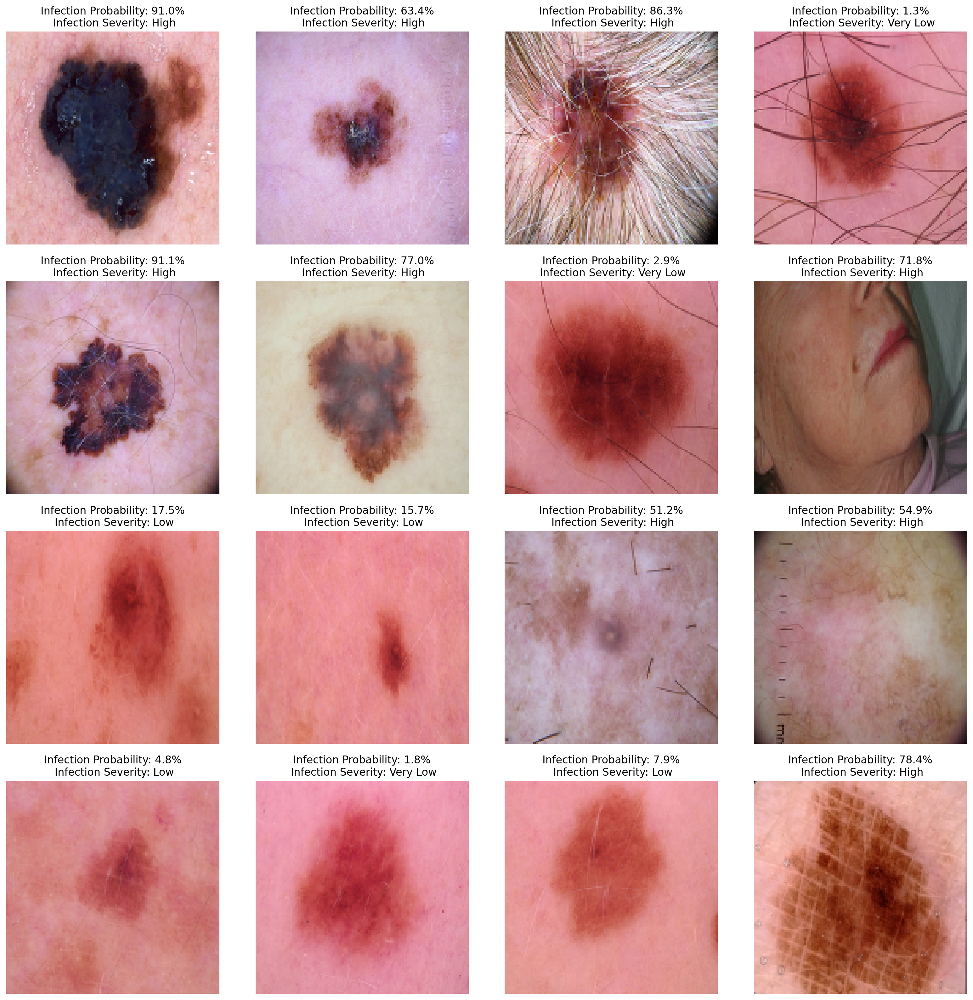

In [38]:
# Predicting Values
y_preds_probability, y_preds_binary = validateModel.GetModelPredictions(model, X_test)

# Test Results
validateModel.Generate_Model_Test_Classification_Report(y_test, y_preds_binary, "Resnet Deep Learning Model")
validateModel.PlotModelPredictionsOnRandomTestImages(X_test, y_test, y_preds_probability)

## GradCam Activations

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
Image 256: Probability of the tumor being malignant is: 0.30233833
Class probabilities: [0.30233833]
Heatmap values: [[0.8182515  0.61710525 0.6390044  0.3707898  0.41946316 0.47491962
  0.2451826  0.6910143  0.24583197]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [1.         0.52541083 0.75112987 0.         0.23483612 0.36309808
  0.41695344 0.5422914  0.38763735]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.0414744  0.         0.24928695]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.18808891 0.         0.         0.         0.         0.21553288
  0.         0.         0.10488901]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.24640097 0.5071275  0.         0.10868721 0.     

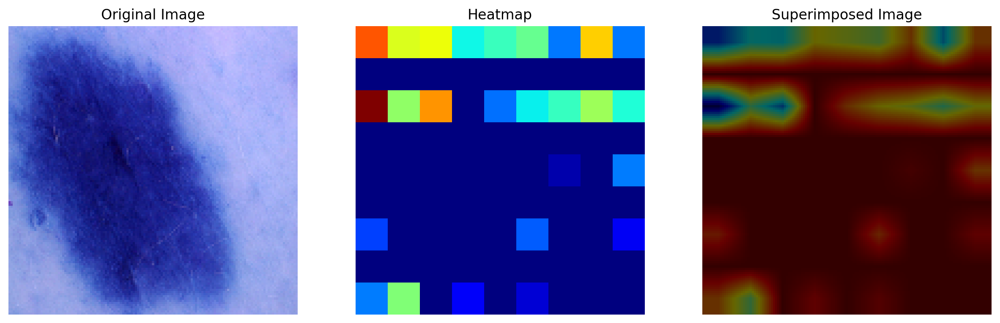

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
Image 57: Probability of the tumor being malignant is: 0.5966567
Class probabilities: [0.5966567]
Heatmap values: [[0.6037435  0.5332549  0.47440273 0.22849375 0.2740471  0.3142847
  0.13787755 0.5509898  0.23938529]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [1.         0.5215342  0.6530909  0.         0.14869852 0.271298
  0.45244592 0.58211297 0.49511537]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.0992479  0.         0.27903897]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.07325513 0.         0.         0.         0.         0.2151576
  0.06504346 0.         0.40079615]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.30082166 0.9111277  0.         0.18221515 0.         0.0

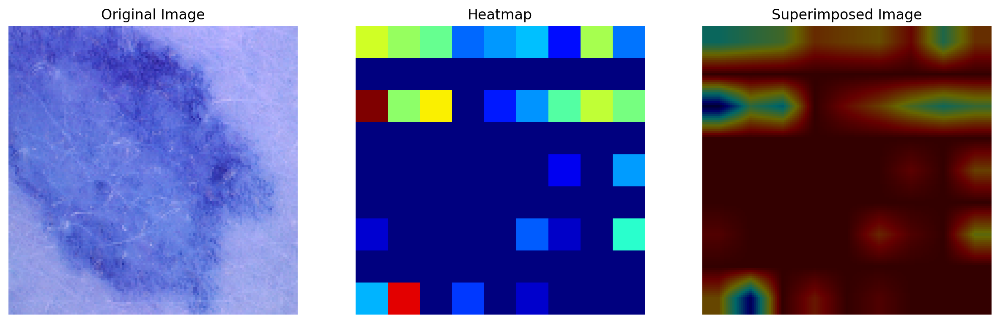

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Image 199: Probability of the tumor being malignant is: 0.7517982
Class probabilities: [0.7517982]
Heatmap values: [[0.56164294 0.51811117 0.39180744 0.14325154 0.23544171 0.2846049
  0.10231961 0.5480299  0.23082145]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.76352704 0.8322078  0.46715644 0.         0.01915135 0.19615665
  0.51884353 0.48854923 0.62891805]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.09421757 0.         0.3421832 ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.         0.         0.         0.         0.01429895 0.36594382
  0.1991917  0.         0.24487856]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.49251604 1.         0.         0.23864669 0.        

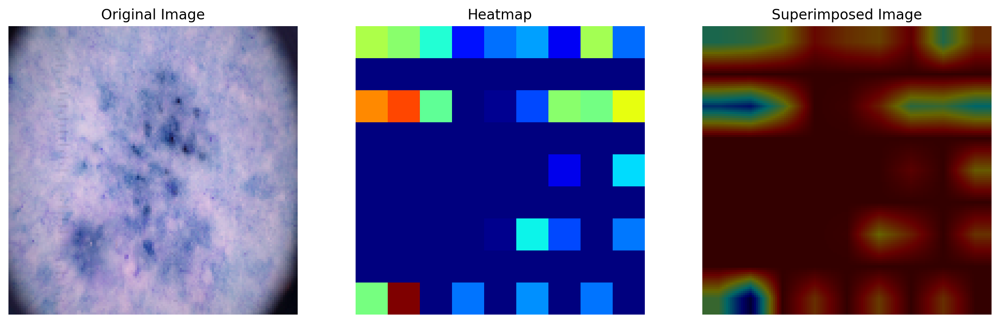

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
Image 159: Probability of the tumor being malignant is: 0.34745082
Class probabilities: [0.34745082]
Heatmap values: [[0.9097541  0.7108524  0.6963079  0.36461684 0.45393002 0.524187
  0.28053173 0.8069688  0.29806083]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [1.         0.683368   0.6828315  0.         0.12770097 0.28772077
  0.55834943 0.6403252  0.6158516 ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.17948301 0.         0.41765615]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.         0.32799104 0.         0.06319208 0.         0.59440523
  0.341032   0.         0.39766207]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.17636408 0.86178756 0.         0.25024837 0.       

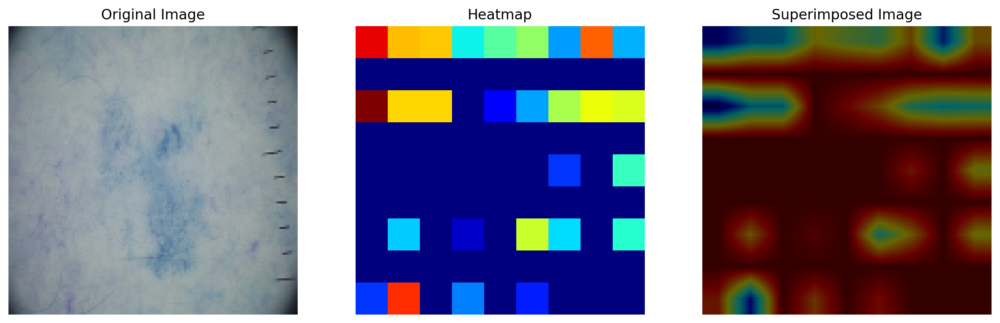

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Image 107: Probability of the tumor being malignant is: 0.8137103
Class probabilities: [0.8137103]
Heatmap values: [[0.840449   0.61238503 0.66677207 0.30457503 0.40313545 0.4964075
  0.22542953 0.76716334 0.2422558 ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.65783995 0.5307457  0.43554372 0.         0.         0.11228245
  0.4134751  0.40145725 0.4958716 ]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.         0.         0.         0.         0.         0.
  0.1152273  0.         0.47585133]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.         0.87365717 0.         0.10587355 0.         0.39177006
  0.24211589 0.         0.68407536]
 [0.         0.         0.         0.         0.         0.
  0.         0.         0.        ]
 [0.48661485 1.         0.         0.29409847 0.        

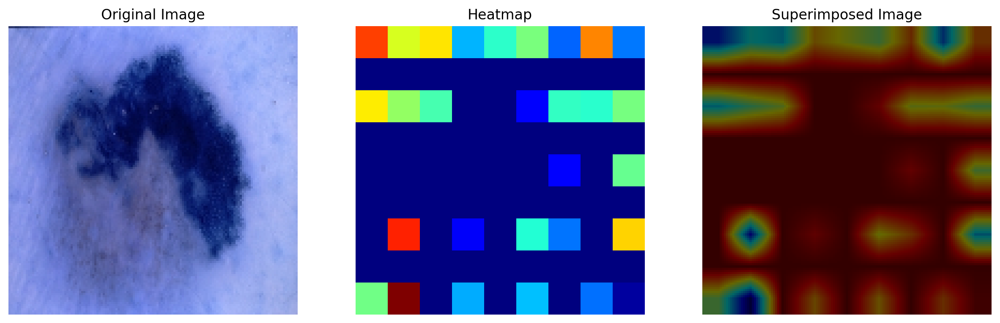

In [54]:
import numpy as np
import cv2
import random
import matplotlib.pyplot as plt
import tensorflow as tf

def get_gradcam_heatmap(model, img_array, layer_name, class_index):
    # Create a model that maps the input image to the activations of the chosen layer
    grad_model = tf.keras.models.Model(
        inputs=model.input,
        outputs=[model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_layer_output, predictions = grad_model(np.array([img_array]))
        loss = predictions[:, class_index]

    # Compute gradients of the loss with respect to the activations
    grads = tape.gradient(loss, conv_layer_output)

    # Global Average Pooling
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1))

    # Multiply the feature map by the mean of the gradients
    heatmap = conv_layer_output[0] @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Apply the ReLU activation function
    heatmap = tf.maximum(heatmap, 0)

    # Normalize the heatmap
    heatmap /= tf.reduce_max(heatmap)

    return heatmap.numpy()

def superimpose_heatmap(heatmap, img_array, alpha=0.4):
    # Resize heatmap to match the input image size
    heatmap = cv2.resize(heatmap, (img_array.shape[1], img_array.shape[0]))
    heatmap = np.uint8(255 * heatmap)  # Convert to 0-255 range and uint8
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)  # Apply colormap

    # Ensure img_array is of type uint8
    img_array = np.uint8(img_array)

    # Superimpose the heatmap on the original image
    superimposed_img = cv2.addWeighted(heatmap, alpha, img_array, 1 - alpha, 0)
    return superimposed_img

# Assuming 'model' is your trained ResNet model
# and 'X_test' is your test dataset of images

for i in random.sample(range(len(X_test)), 5):
    img = cv2.cvtColor(X_test[i], cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    img_array = np.expand_dims(img, axis=0)  # Expand dimensions for prediction

    # Make prediction
    predictions = model.predict(img_array)
    class_index = np.argmax(predictions[0])  # Get the predicted class index
    print(f"Image {i}: Probability of the tumor being malignant is:", predictions[0][class_index])
    
    # Optional: Print all class probabilities for debugging
    print("Class probabilities:", predictions[0])

    # Get the Grad-CAM heatmap
    heatmap = get_gradcam_heatmap(model, img, "conv4_block6_2_conv", class_index)

    # Print heatmap values for debugging
    print("Heatmap values:", heatmap)

    # Superimpose the heatmap on the original image
    superimposed_img = superimpose_heatmap(heatmap, img)

    # Display the images using matplotlib
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(img)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Heatmap")
    plt.imshow(heatmap, cmap='jet')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Superimposed Image")
    plt.imshow(superimposed_img)
    plt.axis('off')

    plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
Image 175: Probability of the tumor being malignant is: 0.62860245
Class probabilities: [0.62860245]
Heatmap values: [[0.05915197 0.04901119 0.06502716 0.13359107 0.11369324]
 [0.10187547 0.06829697 0.13353252 0.36823392 0.27611843]
 [0.03552673 0.02391732 0.10106009 0.5943742  0.8568632 ]
 [0.08394089 0.01143946 0.0076796  0.42094418 1.        ]
 [0.4426655  0.5247642  0.49073792 0.762283   0.5416393 ]]


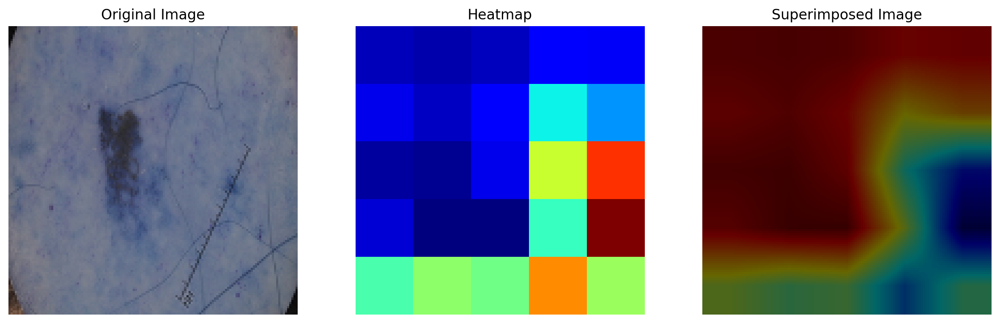

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Image 190: Probability of the tumor being malignant is: 0.14601468
Class probabilities: [0.14601468]
Heatmap values: [[0.05952927 0.04663647 0.06356487 0.1349612  0.11886884]
 [0.09860313 0.06164692 0.12619309 0.3748727  0.29129305]
 [0.03521266 0.01546149 0.06419921 0.5886803  0.8735562 ]
 [0.08323858 0.00394215 0.         0.39832917 1.        ]
 [0.44388613 0.5226464  0.5000369  0.7784794  0.54053485]]


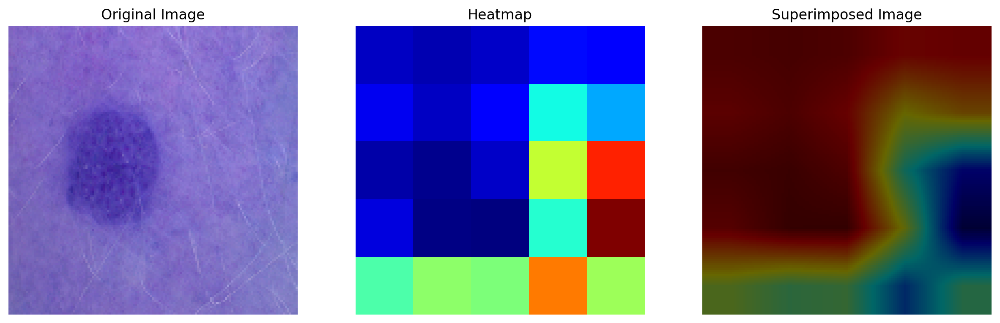

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
Image 167: Probability of the tumor being malignant is: 0.8688051
Class probabilities: [0.8688051]
Heatmap values: [[0.05338503 0.04522273 0.05800596 0.1296066  0.1105116 ]
 [0.08506688 0.06264856 0.1294327  0.34843388 0.25967738]
 [0.04310675 0.0370261  0.18375981 0.6111354  0.8225322 ]
 [0.08133911 0.02802946 0.06752544 0.50989914 1.        ]
 [0.4063424  0.47389308 0.4427342  0.6986304  0.50187874]]


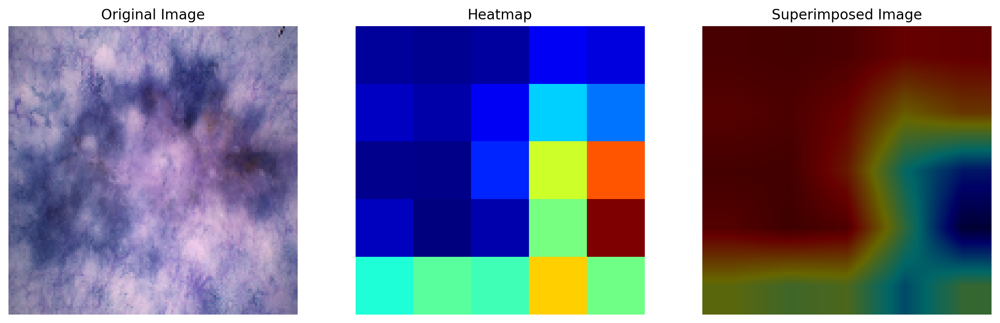

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
Image 71: Probability of the tumor being malignant is: 0.83973324
Class probabilities: [0.83973324]
Heatmap values: [[0.05121302 0.04080723 0.05734925 0.12069662 0.11201976]
 [0.08851525 0.05734276 0.1256597  0.34535548 0.25477466]
 [0.04655345 0.05975092 0.14940864 0.6157172  0.81283396]
 [0.08518755 0.02561583 0.05841985 0.49205992 1.        ]
 [0.40293065 0.486627   0.46158078 0.72090495 0.5056543 ]]


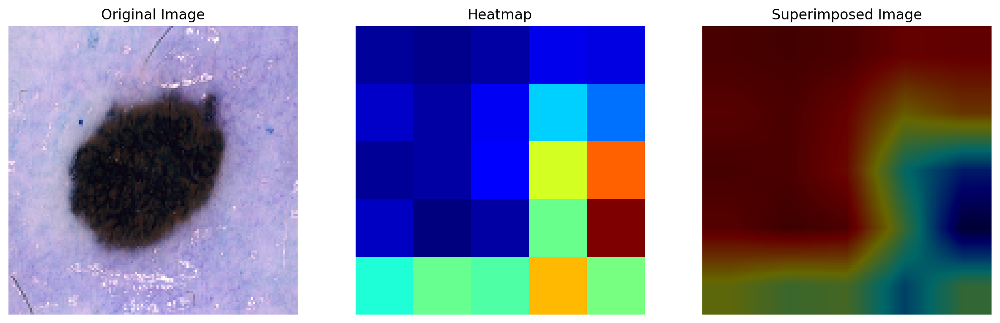

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Image 233: Probability of the tumor being malignant is: 0.5875634
Class probabilities: [0.5875634]
Heatmap values: [[0.06075996 0.04709102 0.06160334 0.12886924 0.11133376]
 [0.09644749 0.06249503 0.12420131 0.36591637 0.27270976]
 [0.03679483 0.02492902 0.08646698 0.59236985 0.8436994 ]
 [0.08321753 0.00880756 0.01213164 0.4243236  1.        ]
 [0.44172964 0.5234574  0.49569848 0.77517724 0.53042793]]


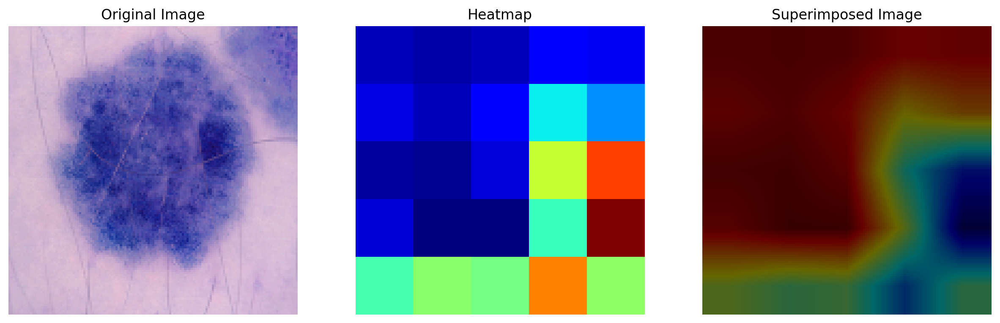

In [51]:
import numpy as np
import cv2
import random
import matplotlib.pyplot as plt
import tensorflow as tf

class GradCamUtils():
    
    def __init__(self, model, last_conv_layer_name):
        self.model = model
        self.last_conv_layer_name = last_conv_layer_name
        
        # Get the layer object of the last convolutional layer
        last_conv_layer = self.model.get_layer(self.last_conv_layer_name).output
        
        # Create a model that maps the input image to the activations of the last conv layer as well as the output predictions
        self.grad_model = tf.keras.models.Model(
            inputs=model.input,
            outputs=[last_conv_layer, model.output]
        )
    
    def get_gradcam_heatmap(self, img_array, class_index):
        # Create a gradient tape to watch the activations
        with tf.GradientTape() as tape:
            conv_layer_output, predictions = self.grad_model(np.array([img_array]))
            loss = predictions[:, class_index]

        # Compute gradients of the loss with respect to the activations
        grads = tape.gradient(loss, conv_layer_output)

        # Global Average Pooling
        pooled_grads = tf.reduce_mean(grads, axis=(0, 1))

        # Multiply the feature map by the mean of the gradients
        heatmap = conv_layer_output[0] @ pooled_grads[..., tf.newaxis]
        heatmap = tf.squeeze(heatmap)

        # Apply the ReLU activation function
        heatmap = tf.maximum(heatmap, 0)

        # Normalize the heatmap
        heatmap /= tf.reduce_max(heatmap)

        return heatmap.numpy()
    
    def superimpose_heatmap(self, heatmap, img_array, alpha=0.4):
        # Resize heatmap to match the input image size
        heatmap = cv2.resize(heatmap, (img_array.shape[1], img_array.shape[0]))
        heatmap = np.uint8(255 * heatmap)  # Convert to 0-255 range and uint8
        heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)  # Apply colormap

        # Ensure img_array is of type uint8
        img_array = np.uint8(img_array)

        # Superimpose the heatmap on the original image
        superimposed_img = cv2.addWeighted(heatmap, alpha, img_array, 1 - alpha, 0)
        return superimposed_img


# Assuming 'model' is your trained ResNet model and 'X_test' is your test dataset of images
last_conv_layer_name = "conv5_block3_out"  # Update this to your model's last conv layer
gCam = GradCamUtils(model, last_conv_layer_name)

for i in random.sample(range(len(X_test)), 5):
    img = cv2.cvtColor(X_test[i], cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    img_array = np.expand_dims(img, axis=0)  # Expand dimensions for prediction

    # Make prediction
    predictions = model.predict(img_array)
    class_index = np.argmax(predictions[0])  # Get the predicted class index
    print(f"Image {i}: Probability of the tumor being malignant is:", predictions[0][class_index])
    
    # Optional: Print all class probabilities for debugging
    print("Class probabilities:", predictions[0])

    # Get the Grad-CAM heatmap
    heatmap = gCam.get_gradcam_heatmap(img, class_index)

    # Print heatmap values for debugging
    print("Heatmap values:", heatmap)

    # Superimpose the heatmap on the original image
    superimposed_img = gCam.superimpose_heatmap(heatmap, img)

    # Display the images using matplotlib
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(img)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Heatmap")
    plt.imshow(heatmap, cmap='jet')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Superimposed Image")
    plt.imshow(superimposed_img)
    plt.axis('off')

    plt.show()


In [55]:
def blend_heatmap(heatmap, img_array, alpha=0.4):
    """
    Blend the heatmap variations over the original image to highlight areas of interest.

    Parameters:
        heatmap: The class activation heatmap for the concerned image.
        img_array: The original image.
        alpha (optional): A number between 0 and 1 to control the weighted blending of the images.

    Returns:
        blended_img: The blended version of the original image and the corresponding class activation map.
    """

    # Resize heatmap to match the input image size
    heatmap = cv2.resize(heatmap, (img_array.shape[1], img_array.shape[0]))
    heatmap = np.uint8(255 * heatmap)  # Convert to 0-255 range and uint8
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)  # Apply colormap

    # Ensure img_array is of type uint8
    img_array = np.uint8(img_array * 255)  # Scale if necessary

    # Blend the heatmap with the original image
    blended_img = cv2.addWeighted(heatmap, alpha, img_array, 1 - alpha, 0)
    
    return blended_img


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
Image 260: Probability of the tumor being malignant is: 0.56586564
Class probabilities: [0.56586564]
Unique heatmap values for image 260: [0.         0.10909009 0.11210104 0.11472429 0.20649418 0.22640449
 0.26174375 0.2767562  0.2815844  0.31179234 0.36206353 0.37763584
 0.39820316 0.44089797 0.44748074 0.52632886 0.5427556  0.59746635
 0.6708697  0.6880255  0.7141155  0.72534156 0.7857649  0.9239776
 0.93517274 1.        ]


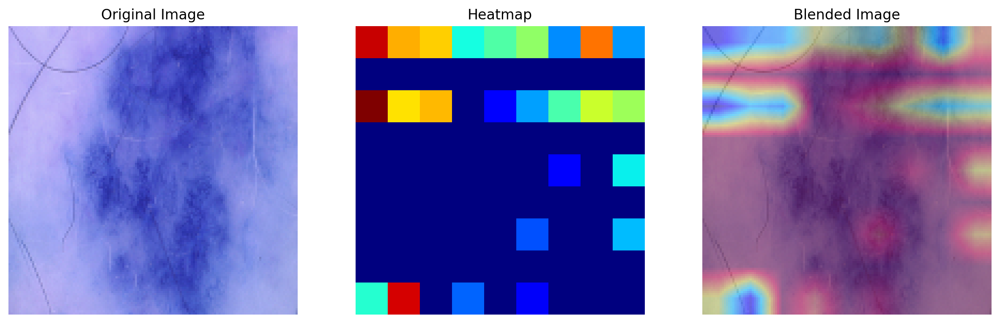

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Image 196: Probability of the tumor being malignant is: 0.2511667
Class probabilities: [0.2511667]
Unique heatmap values for image 196: [0.         0.00245626 0.01064711 0.08623149 0.13102509 0.15638635
 0.19260785 0.19261408 0.21106228 0.23139037 0.2573758  0.26752803
 0.3244932  0.33376732 0.34075278 0.3938428  0.39926916 0.4174228
 0.4200663  0.45144528 0.49527052 0.50960845 0.5784283  0.629894
 0.6761571  0.6887966  0.72320473 1.        ]


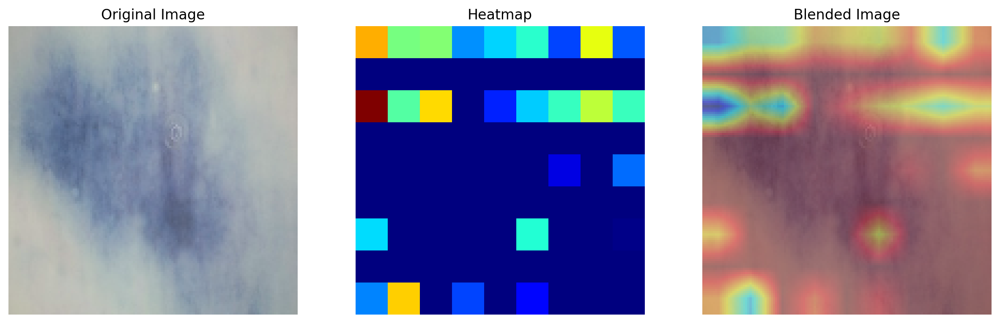

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Image 259: Probability of the tumor being malignant is: 0.46601316
Class probabilities: [0.46601316]
Unique heatmap values for image 259: [0.         0.02061651 0.06127346 0.12094011 0.13234897 0.15573524
 0.20506413 0.22133213 0.22451808 0.23754585 0.2386027  0.2891572
 0.2927201  0.34502485 0.34859562 0.4172146  0.47175425 0.48791996
 0.54063904 0.56824875 0.5750469  0.6401815  0.65462714 0.683551
 0.6854391  0.76395196 1.        ]


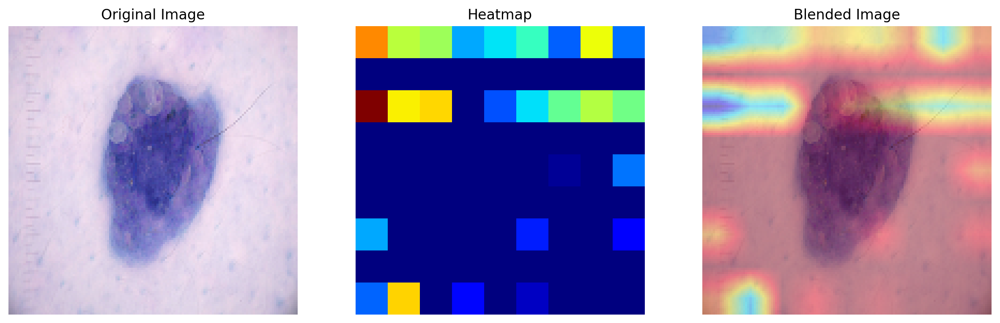

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
Image 11: Probability of the tumor being malignant is: 0.57467794
Class probabilities: [0.57467794]
Unique heatmap values for image 11: [0.         0.05682814 0.08992556 0.13100372 0.14570735 0.16495194
 0.16673614 0.19045964 0.2427621  0.25658882 0.3088185  0.30924556
 0.32071933 0.33093762 0.3819581  0.43792948 0.44423229 0.44961527
 0.46632364 0.56394345 0.5755707  0.59031624 0.6716725  0.69761777
 0.72437066 0.7700963  1.        ]


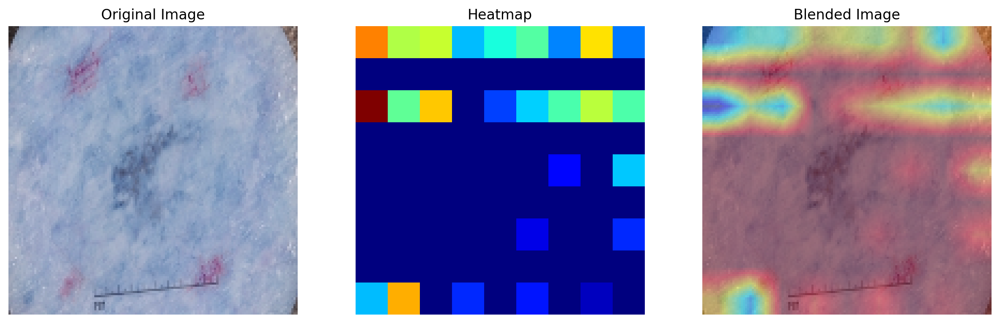

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Image 114: Probability of the tumor being malignant is: 0.046296373
Class probabilities: [0.04629637]
Unique heatmap values for image 114: [0.         0.00338705 0.0046338  0.00915136 0.02950951 0.09312546
 0.11291834 0.11435398 0.13393378 0.17104504 0.18450134 0.19000198
 0.21347725 0.21672337 0.22754738 0.237578   0.28753176 0.313092
 0.33779955 0.34651086 0.357264   0.3796513  0.38273475 0.4734635
 0.510854   0.5468729  0.5514775  0.7780715  1.        ]


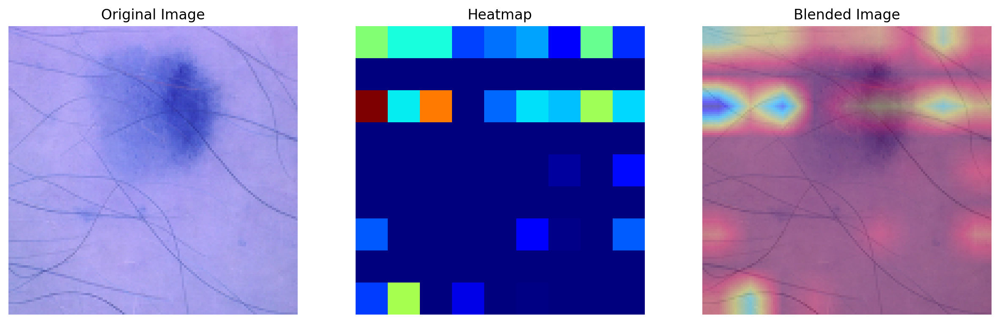

In [57]:
for i in random.sample(range(len(X_test)), 5):
    img = cv2.cvtColor(X_test[i], cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
    img_array = np.expand_dims(img, axis=0)  # Expand dimensions for prediction

    # Make prediction
    predictions = model.predict(img_array)
    class_index = np.argmax(predictions[0])  # Get the predicted class index
    print(f"Image {i}: Probability of the tumor being malignant is:", predictions[0][class_index])
    
    # Debugging: Print class probabilities
    print("Class probabilities:", predictions[0])

    # Get the Grad-CAM heatmap
    heatmap = get_gradcam_heatmap(model, img, "conv4_block6_2_conv", class_index)

    # Debugging: Check unique heatmap values
    print("Unique heatmap values for image {}: {}".format(i, np.unique(heatmap)))

    # Blend the heatmap over the original image
    blended_img = blend_heatmap(heatmap, img)

    # Display the images using matplotlib
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(img)
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Heatmap")
    plt.imshow(heatmap, cmap='jet')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Blended Image")
    plt.imshow(blended_img)
    plt.axis('off')

    plt.show()
